## Female education and labour force participation 

**Research question:** Do countries with high female secondary completion rate tend to have higher female labour force participation? 

**Dataset:** World Development Indicators. Source: https://www.kaggle.com/datasets/theworldbank/world-development-indicators

**Supplementary datasets:**
Country - Region mapping. Source: https://www.kaggle.com/datasets/andradaolteanu/country-mapping-iso-continent-region 
GeoJSON data created by the Natural Earth project. Source:http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson

**Motivation:**
The motivation for the research question “Do countries with high female secondary completion rate tend to have higher female labour force participation?” is because ensuring females have equal opportunity to participate in the labour force can have numerous positive benefits on the economy and for female empowerment. Namely, research show that female labour force participation have positive effects on economic growth and by participating in the labour force, women gain economic independence and increase household income. 
To increase labour force participation it is important to understand what factors can increase so that decision can make policies that enhances female labour force participation. Therefore, I will assess if there is a correlation between female labour force participation rate and female education rate, to understand improving education amongst females can increase labour force participation. Moreover, I selected female education as I find it meaningful variable to assess, as ensuring female education has many positive influences on females lives, such as improved health and life skills (Unicef).


**Findings summary:**

From the data visualisation using scatter plot and by calculating the correlation coefficient, we see a positive correlation, and I can therefore answer my research question. 
- Yes, countries with high female secondary completion rate do tend to have higher female labour force participation. 
However, in my motivations, I noted that I wished to understand if improving female education rate can contribute to increase female labour force participation. But even if we see a correlation in the results, this do not mean there is a causation. Moreover, as I saw from analysing the outliers in the bubble chart, many countries do not have high female labour force participation even with high education, and vise versa. Thus, as also other research suggest, the contributing factors to female labour force participation are numerous and complex (Verick, 2018). Answering the question from my motivations falls outside of the scope of this mini project, but it would be be an interesting avenue to explore for later analysis. 
In this mini project I illustrated a positive relationship between female education and labour force participation and could answer my research question. 

**Acknowledgements:**
Bubble chart inspired by Hans Rosling in Ted Talk: The best stats you've ever seen | Hans Rosling:
https://www.youtube.com/watch?v=hVimVzgtD6w

**References:**
Definitions from the World Bank Metadata Glossary: 
https://databank.worldbank.org/metadataglossary/all/series

Python Folium: Create Web Maps From Your Data: 
https://realpython.com/python-folium-web-maps-from-data/

Verick, S. Female labor force participation and development. IZA World of Labor 2018: 87 doi: 10.15185/izawol.87.v2: 
https://wol.iza.org/articles/female-labor-force-participation-and-development/long

Girls' education, Unicef: 
https://www.unicef.org/education/girls-education

## Importing libraries 

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


## Initial Data Exploration
Here, I explore the data to understand the data shape and structure and to find relevant variables. 

In [39]:
df= pd.read_csv('Data\WDIData.csv')
print(df.shape)
display(df.sample(4))

(422136, 64)


,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,Unnamed: 63
180171,Faroe Islands,FRO,"Population ages 0-14, male (% of total)",SP.POP.0014.MA.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
340013,Sao Tome and Principe,STP,"Patent applications, nonresidents",IP.PAT.NRES,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,2.0,NaN,8.0,3.0,NaN,NaN,NaN,NaN,NaN
285791,Mongolia,MNG,"PPG, bonds (AMT, current US$)",DT.AMT.PBND.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,75000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,500000000.0,NaN
16378,Europe & Central Asia (IDA & IBRD countries),TEC,"Educational attainment, Doctoral or equivalent...",SE.TER.CUAT.DO.FE.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
# What indicators could I assess? 
# I search for string values for words to find a suiting indicators
indicators_female = df.query('`Indicator Name`.str.contains("female")==True')['Indicator Name'].unique().tolist()
print(indicators_female)

['Account ownership at a financial institution or with a mobile-money-service provider, female (% of population ages 15+)', 'Adjusted net enrollment rate, primary, female (% of primary school age children)', 'Adolescents out of school, female (% of female lower secondary school age)', 'Average working hours of children, study and work, female, ages 7-14 (hours per week)', 'Average working hours of children, working only, female, ages 7-14 (hours per week)', 'Child employment in agriculture, female (% of female economically active children ages 7-14)', 'Child employment in manufacturing, female (% of female economically active children ages 7-14)', 'Child employment in services, female (% of female economically active children ages 7-14)', 'Children in employment, female (% of female children ages 7-14)', 'Children in employment, self-employed, female (% of female children in employment, ages 7-14)', 'Children in employment, study and work, female (% of female children in employment, ag

I select two variables I wish to further analyse, and then I check the World Bank metadata glossary to understand the variables.

## Selected variables defintition: 

**Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)**

_"Labor force participation rate is the proportion of the population ages 15 and older that is economically active: all people who supply labor for the production of goods and services during a specified period."_

**Lower secondary completion rate, female (%)**
**Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)**:
_"The percentage of population ages 25 and over that attained or completed lower secondary education."_

_"Lower secondary education completion rate is measured as the gross intake ratio to the last grade of lower secondary education (general and pre-vocational). It is calculated as the number of new entrants in the last grade of lower secondary education, regardless of age, divided by the population at the entrance age for the last grade of lower secondary education."_

Definitions from the World Bank Metadata Glossary: 
https://databank.worldbank.org/metadataglossary/all/series

## Data cleaning 

In [41]:
# storing the selected variables in a list 
indicators = ["Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)","Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)"]

In [42]:
# For ease, I replace space with underscore in the column names
df.columns = [c.replace(' ', '_') for c in df.columns]

In [43]:
df.head()

,Country_Name,Country_Code,Indicator_Name,Indicator_Code,1960,1961,1962,1963,1964,1965,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,Unnamed:_63
0,Arab World,ARB,"2005 PPP conversion factor, GDP (LCU per inter...",PA.NUS.PPP.05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"2005 PPP conversion factor, private consumptio...",PA.NUS.PRVT.PP.05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,Access to clean fuels and technologies for coo...,EG.CFT.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,82.407647,82.827636,83.169227,83.587141,83.954293,84.230630,84.570425,NaN,NaN,NaN
3,Arab World,ARB,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,86.136134,86.782683,87.288244,88.389705,88.076774,88.517967,88.768654,NaN,NaN,NaN
4,Arab World,ARB,"Access to electricity, rural (% of rural popul...",EG.ELC.ACCS.RU.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,74.543489,75.770972,76.772916,78.839139,77.487377,78.564439,78.958780,NaN,NaN,NaN


I notice there are non countries in the country variable, for example "Arab World" and "World". 
I open the csv file and see that non countries are listed first until the first country is listed at index 75154.
I therefore slice the dataset from this observation until the end of the dataframe to only include countries in the data analysis. 

In [44]:
# slice dataframe to only include countries 
# select only the indicators I will analyse
# drop columns not needed 

fdf = (
    df.loc[75154:]
    .query('Indicator_Name in @indicators')
    .drop(columns=['Country_Code','Indicator_Code'])
)

In [45]:
# Make a long dataframe 
stack_df = (
    fdf.set_index(['Country_Name','Indicator_Name'])
   .stack()
   .reset_index()
   .rename({'level_2': 'Year', 0:'Value'}, axis=1)
   )
stack_df.head()

,Country_Name,Indicator_Name,Year,Value
0,Afghanistan,"Educational attainment, at least completed low...",1975,1.401440
1,Afghanistan,"Educational attainment, at least completed low...",1979,0.803100
2,Afghanistan,"Labor force participation rate, female (% of f...",1990,44.348000
3,Afghanistan,"Labor force participation rate, female (% of f...",1991,44.359001
4,Afghanistan,"Labor force participation rate, female (% of f...",1992,44.365002


In [46]:
# Make a wide table to summarise the two variables with describe()
long_df = stack_df.pivot_table(index=['Country_Name','Year'], columns='Indicator_Name', values='Value').reset_index()
long_df

Indicator_Name,Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
0,Afghanistan,1975,1.40144,NaN
1,Afghanistan,1979,0.80310,NaN
2,Afghanistan,1990,NaN,44.348000
3,Afghanistan,1991,NaN,44.359001
4,Afghanistan,1992,NaN,44.365002
...,...,...,...,...
5639,Zimbabwe,2014,52.47886,78.791000
5640,Zimbabwe,2015,NaN,78.925003
5641,Zimbabwe,2016,NaN,79.082001
5642,Zimbabwe,2017,NaN,79.261002


In [47]:
# Making shorter label names for the variables to be shown in the figures
indicator_label = [x.split("(",1)[0] for x in indicators]
indicator_label = ['Labor force participation rate (female)',
 'Completed secondary education rate (female)']

In [48]:
# remove years with missing data in at least one of the indicators 
print(f"Total observations: {len(long_df)}")
cdf = long_df.dropna()
print(f"Observations after removing observations with missing: {len(cdf)}")
# Where does missing data occur? 
display(pd.DataFrame(long_df.isna().value_counts()).style.set_table_styles([dict(selector="th",props=[('max-width', '350px')])]))

Total observations: 5644
Observations after removing observations with missing: 839


### Notes on missing data: 
- Most missingness occurs in the "Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)"
- The reason missing data occur might be because the indicator data is collected in national survey which might not necessarily be completed every year. From the World Bank Metadata glossary: _"Data are collected by the UNESCO Institute for Statistics mainly from national population census, household survey, and labour force survey."_
- There is no missing data for year or country
- Only 221 countries have missingness in the labour force participation variable

# Data exploration 

In [49]:
# look at cleaned dataframe called cdf
cdf.head()

Indicator_Name,Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
42,Albania,2001,70.99655,56.341999
49,Albania,2008,78.76185,52.717999
52,Albania,2011,82.15253,54.173000
53,Albania,2012,85.21604,55.701000
77,Algeria,2006,20.89734,14.120000


In [50]:
# Show countries with most and least observations 
cdf.groupby(['Country_Name'])['Year'].count().sort_values(ascending=False)

Country_Name
Portugal                 20
Sweden                   19
Cyprus                   14
Singapore                14
Mexico                   14
                         ..
Estonia                   1
Cote d'Ivoire             1
Canada                    1
South Sudan               1
Sao Tome and Principe     1
Name: Year, Length: 149, dtype: int64

In [51]:
print(f"Range of years in the dataframe is: {cdf.Year.min()} - {cdf.Year.max()}")

Range of years in the dataframe is: 1990 - 2017


In [52]:
cdf.describe()

Indicator_Name,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
count,839.000000,839.000000
mean,63.127458,57.396665
std,26.187131,14.997656
min,0.941760,12.567000
25%,44.449375,50.133001
50%,64.770480,59.876999
75%,87.458355,67.768497
max,100.000000,91.947998


In [53]:
print(f"Country/year with the lowest and higest {indicator_label[0]}\n")
print(f"---- Lowest {indicator_label[0]} -----")
display(cdf.nsmallest(3, indicators[0]).drop(columns=indicators[1])
        .style.hide()
        .format(precision=2)
        .set_table_styles([dict(selector="th",props=[('max-width', '350px')])]))
print(f"---- Highest {indicator_label[0]} -----n")
display(cdf.nlargest(3, indicators[0]).drop(columns=indicators[1])
        .style.hide()
        .format(precision=2)
        .set_table_styles([dict(selector="th",props=[('max-width', '350px')])]))

Country/year with the lowest and higest Labor force participation rate (female)

---- Lowest Labor force participation rate (female) -----


Country_Name,Year,"Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
Jordan,2003,12.57
Iraq,2013,12.60
Syrian Arab Republic,2009,13.75


---- Highest Labor force participation rate (female) -----n


Country_Name,Year,"Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
Burundi,1990,91.95
Tanzania,2002,86.91
Rwanda,2010,85.07


In [54]:
print(f"Country/year with the lowest and higest {indicator_label[1]}\n")
print(f"---- Lowest {indicator_label[1]} -----")
display(cdf.nsmallest(3, indicators[1]).drop(columns=indicators[0])
        .style.hide()
        .format(precision=2)
        .set_table_styles([dict(selector="th",props=[('max-width', '350px')])]))
print(f"---- Highest {indicator_label[1]} -----")
display(cdf.nlargest(3, indicators[1]).drop(columns=indicators[0])
        .style.hide()
        .format(precision=2)
        .set_table_styles([dict(selector="th",props=[('max-width', '350px')])]))

Country/year with the lowest and higest Completed secondary education rate (female)

---- Lowest Completed secondary education rate (female) -----


Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)"
Burkina Faso,2007,0.94
Burundi,1990,1.77
Tanzania,2002,4.16


---- Highest Completed secondary education rate (female) -----


Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)"
Denmark,2004,100.00
Denmark,2008,100.00
Latvia,2016,100.00


In [55]:
# Find the year with the most observations
year = cdf.Year.value_counts().index[0]
print(f"The year with the most observations without missing data is: {year}")

The year with the most observations without missing data is: 2010


# Data analysis and visualisation 
I have selected the year with most observations, 2010, and will assess if there is a correlation between the two variables using first a scatter plot with the matplot library. I show a scatter plot with a regression line. I will also show the correlation coefficient between the vairables and then describe what the figure and correlaiton coefficient can tell me. 

Next, I will visualise the rates of Female secondaary complation rate and Labour force participation in the world using the Folium package by adding a colored overlay of the world map. 

After, I show a bubble chart with population size representing the size of the bubble and assess the outliers usiing the interactive components to see each country in the figure. 

Last, I will a line chart to visualise how the two rates have developed over time for all the countries in the cleaned dataframe. 


### Visualising correlation
## Scatter plot with matplot lib

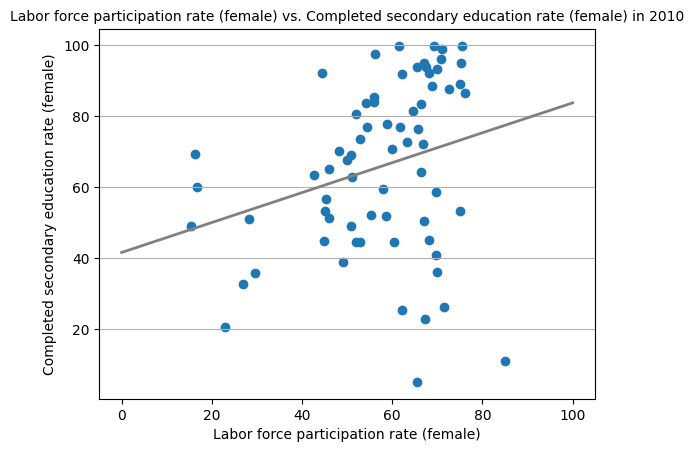

In [56]:
# Scatter plot 

fig, axis = plt.subplots()

axis.yaxis.grid(True)
axis.set_title(f"{indicator_label[0]} vs. {indicator_label[1]} in {year}",fontsize=10)
axis.set_xlabel(indicator_label[0],fontsize=10)
axis.set_ylabel(indicator_label[1],fontsize=10)
 
axis.scatter(cdf.query('Year == @year')[indicators[0]].values,
            cdf.query('Year == @year')[indicators[1]].values)


# Adding a regression line to the
b, a = np.polyfit(cdf.query('Year == @year')[indicators[0]].values,
            cdf.query('Year == @year')[indicators[1]].values, deg=1)

# Create sequence of 100 numbers from 0 to 100 
xseq = np.linspace(0, 100, num=100)

# Plot regression line
axis.plot(xseq, a + b * xseq, color="#808080", lw=2);
plt.show()

In [57]:
# Correlation coefficient
corr_coeff = np.corrcoef(cdf.query('Year == @year')[indicators[0]].values,
            cdf.query('Year == @year')[indicators[1]].values)[0, 1]
print(f"The correlation coefficient is: {np.round(corr_coeff,3)}")


The correlation coefficient is: 0.266


### What does the correlation coefficient tell us? 
With the positive correlaiton coefficient we see that there is a positive relationship. Meaning, countries with higher Female Education rate have higher female labour force participation. In the summary section of the notebook I will disscuss what we can inferr from these results. 



### Visualising the variables on a world map
### **Color coded map using Folium**

In [58]:
import folium
import pandas as pd

eco_footprints = pd.read_csv("C:/ENV/Læring/DataSci/Week5-Visualization/Data/footprint.csv")
political_countries_url = (
    "http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson"
)

m = folium.Map(location=(40, 10), zoom_start=2)
folium.Choropleth(
    geo_data=political_countries_url,
    data=cdf.query('Year == @year'),
    columns=['Country_Name',indicators[1]],
    key_on="feature.properties.name",
    fill_color='Purples', fill_opacity=1, line_opacity=0.2,
    nan_fill_color="white",
    name = f"{indicator_label[1]} in {year}",
    legend_name=indicator_label[1]).add_to(m) 


folium.Choropleth(
    geo_data=political_countries_url,
    data=cdf.query('Year == @year'),
    columns=['Country_Name',indicators[0]],
    key_on="feature.properties.name",
    fill_color='Greens', fill_opacity=1, line_opacity=0.2,
    nan_fill_color="white",
    name = f"{indicator_label[0]} in {year}",
    legend_name=indicator_label[0]).add_to(m) 

folium.LayerControl().add_to(m)
m.save('folium_map.htlm')
print(f"Countries in {year} by {indicator_label[0]} and {indicator_label[1]}")
print("Select the layers button in the top right corner to change the variable shown on the map")
m

Countries in 2010 by Labor force participation rate (female) and Completed secondary education rate (female)
Select the layers button in the top right corner to change the variable shown on the map


### Visualising Population size, Female Labour force participation and Female secondary education completion 
#### **Bubble chart with Plotly**

Inspired by Hans Rosling I wish to make a bubble chart with size representing populaiton size and colour region. 
I will therefore use data with country and region mapping to add region and I will add population size from the World Bank Data to my cleaned dataframe. 

I use Plotly to make the bubble chart because Plotly figures are interactive so  I can hover over the bubbles and see which country it is and the exact values it has.

**Data preperation steps**: 
- add country - region mapping using mapping from data source: https://www.kaggle.com/datasets/andradaolteanu/country-mapping-iso-continent-region 
- Select the Wolrd Bank dataframe indicator "Population, total" and make a stacked dataframe. Then I merge the stacked population dataframe with the cleaned dataframe.  


In [59]:
## add country - region mapping using mapping from data source: https://www.kaggle.com/datasets/andradaolteanu/country-mapping-iso-continent-region 
regiondf = pd.read_csv("C:\ENV\Læring\DataSci\Week5-Visualization\Data\continents2.csv")
regiondf.head()

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN


In [60]:
# Merge region information to cleaned dataframe
cdf_region = (
    cdf.merge(regiondf[['name','region']], left_on = 'Country_Name', right_on='name', how='left')
    .drop(columns='name')
)
cdf_region.head()

,Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)",region
0,Albania,2001,70.99655,56.341999,Europe
1,Albania,2008,78.76185,52.717999,Europe
2,Albania,2011,82.15253,54.173000,Europe
3,Albania,2012,85.21604,55.701000,Europe
4,Algeria,2006,20.89734,14.120000,Africa


In [61]:
# Add population size information to cleaned dataframe
population_df = (
     df.query('Indicator_Name.str.contains("Population, total")==True')
    .drop(columns=['Country_Code', 'Indicator_Code'])
) 
population_stack = (
    population_df
    .set_index(['Country_Name','Indicator_Name'])
   .stack()
   .reset_index()
   .rename({'level_2': 'Year', 0:'Population_Value'}, axis=1)
   )
population_stack.head()

,Country_Name,Indicator_Name,Year,Population_Value
0,Arab World,"Population, total",1960,92490932.0
1,Arab World,"Population, total",1961,95044497.0
2,Arab World,"Population, total",1962,97682294.0
3,Arab World,"Population, total",1963,100411076.0
4,Arab World,"Population, total",1964,103239902.0


In [62]:
## add population size for bubble chart
cdf_region_pop = (
    cdf_region.merge(population_stack[['Country_Name', 'Year','Population_Value']],
                    on=['Country_Name', 'Year'], how='left')
)
cdf_region_pop.head()

,Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)",region,Population_Value
0,Albania,2001,70.99655,56.341999,Europe,3060173.0
1,Albania,2008,78.76185,52.717999,Europe,2947314.0
2,Albania,2011,82.15253,54.173000,Europe,2905195.0
3,Albania,2012,85.21604,55.701000,Europe,2900401.0
4,Algeria,2006,20.89734,14.120000,Africa,33777915.0


In [63]:
import plotly.express as px

fig = px.scatter(cdf_region_pop.query('Year == @year'), x=indicators[0], y=indicators[1],
	         size="Population_Value", color="region",
                 hover_name="Country_Name", log_x=True, size_max=60)

# update layout 
fig.update_layout(
    title=f"{indicator_label[0]} vs {indicator_label[1]} in {year}",
    xaxis=dict(
        title=indicator_label[0],
        gridcolor='rgb(243, 243, 243)',
        type='log',
        gridwidth=2,
    ),
    yaxis=dict(
        title=indicator_label[1],
        gridcolor='rgb(243, 243, 243)',
        gridwidth=2,
    ),
    paper_bgcolor='white',
    plot_bgcolor='white'
    ) 

fig.show()

## Using interactive components of Plotly figure to understand outliers
- Some countries not following the trend, for example, we can see a few African countries with very low female education rate but very high labour force participation amongst females. Fpr example, Rwanda has the lowest second female education completion rate in 2011 but highest female labour force participation. 
- Zooming in on the higest education we see Norway high on both variables, but CzecH Republic which have slightly higher education rate but have 14 per centage points lower female labour force participation rate (61 v. 75)
- Contrastingly, Jordan and Italy have a similar level of Completed secondary education rate amongst females, at 69 per cent, but Jordan have a very low female labour force participation rate, at 16 per cent while in contrast, in Italy 51 per cent of females participate in the Labour market. 

## Visualising development over time 
### **Line chart using Matplotlib**

since too much data I split into region, more similarities within region as we saw from bubble chart
same legend because.. 

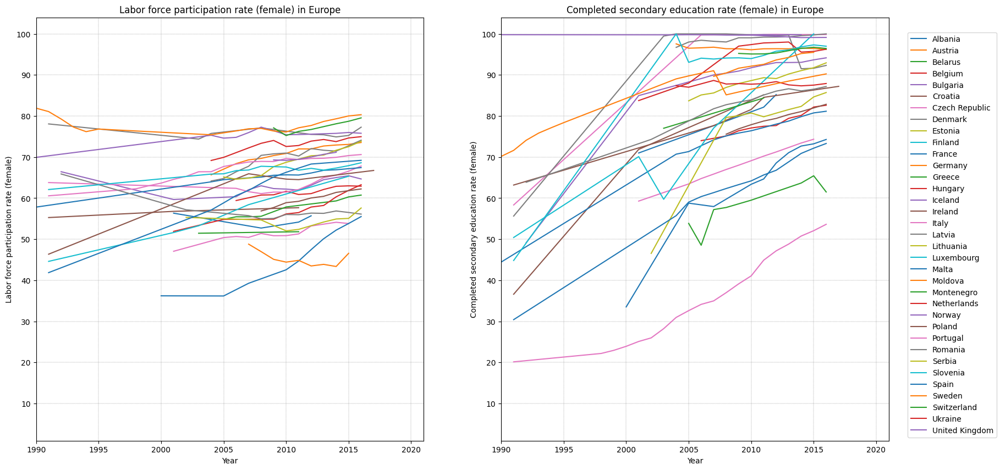

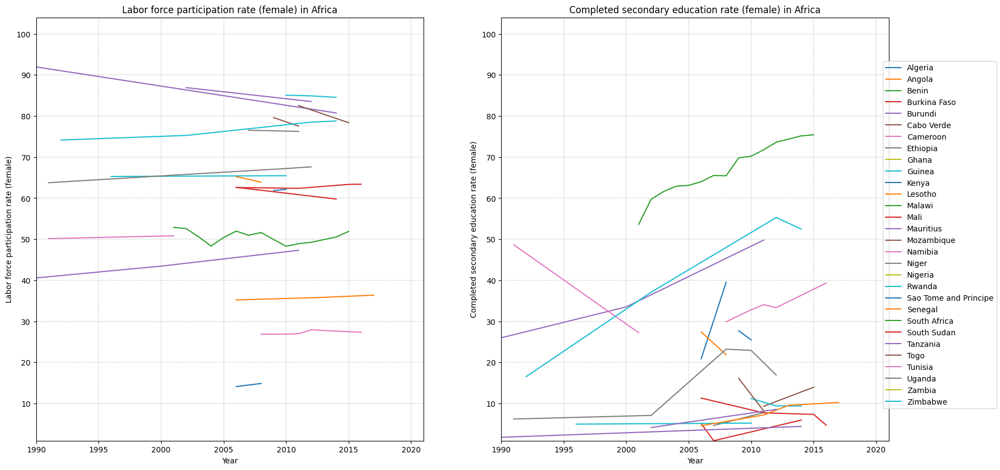

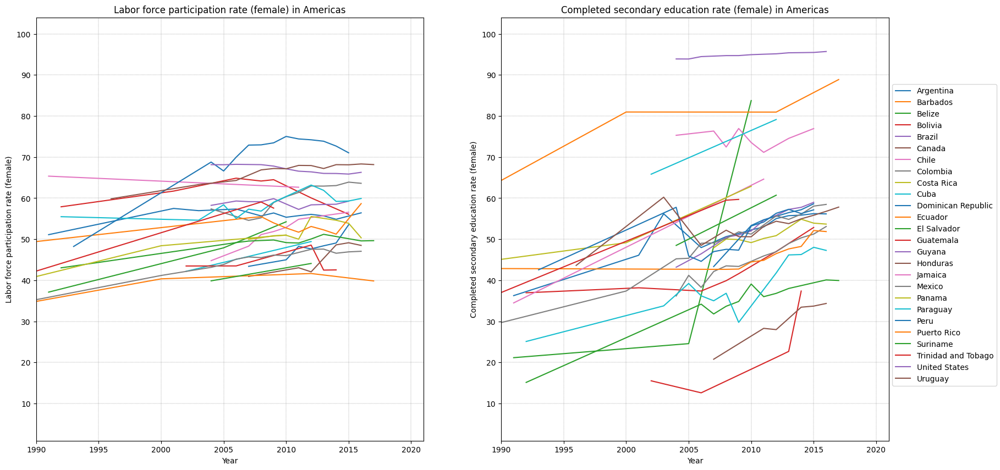

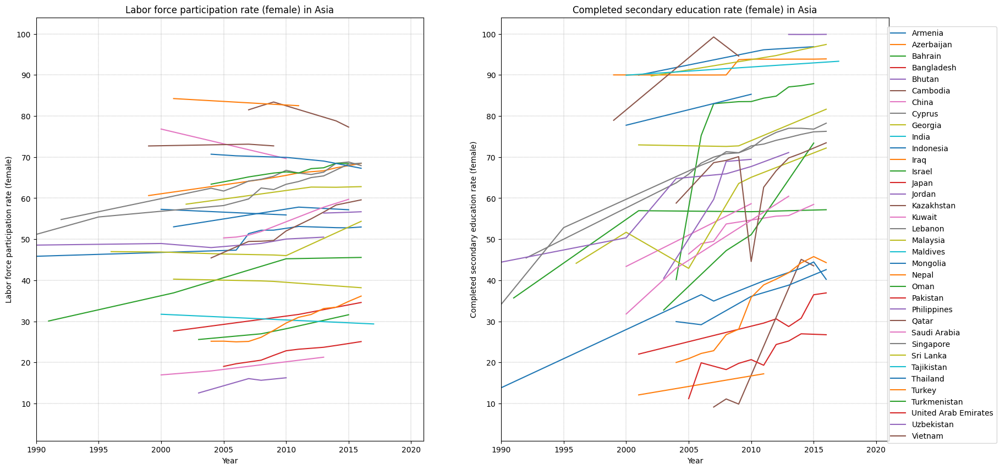

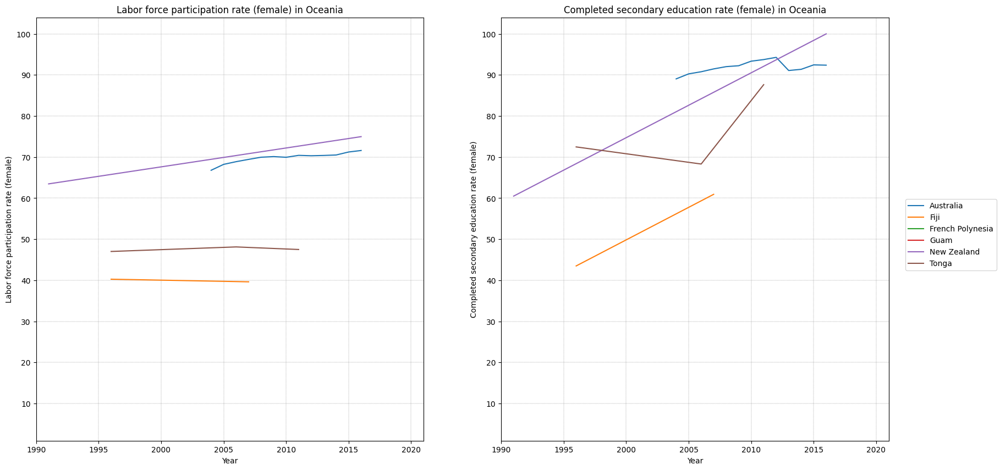

In [64]:
# Loop through unique regions to make a plot for each region 

for region in cdf_region.dropna().region.unique().tolist(): 
    cdf_region['Year'] = cdf_region['Year'].astype(float)
    fig, ax = plt.subplots(1,2, figsize=(20,10))
    # plt.grid(color = 'grey', linestyle = '--', linewidth = 0.3)

    for num, indicator in enumerate(indicators):
        plt.grid(color = 'grey', linestyle = '--', linewidth = 0.3)
        # title and style 
        ax[num].set_title(f"{indicator_label[num]} in {region}")
        ax[num].grid(color = 'grey', linestyle = '--', linewidth = 0.3)

        # xaxis 
        ax[num].set_xlabel('Year')
        ax[num].set_xlim(cdf_region['Year'].min(), (cdf_region['Year'].max()+4))

        # yaxis 
        ax[num].set_yticks(np.arange(cdf_region['Year'].min(), (cdf_region['Year'].max()+4), 10))
        ax[num].set_yticks(np.arange(0, (cdf_region[indicators].max().max()+4), 10))
        ax[num].set_ylabel(indicator_label[num])
        ax[num].set_ylim(cdf_region[indicators].min().min(), cdf_region[indicators].max().max()+4)

        # filter region and loop through countries in regions to plot each country 
        region_cdf = cdf_region.query('region==@region')
        countries_region = region_cdf.Country_Name.unique().tolist()

        for country in countries_region:
            cdf_loop = cdf_region.query('Country_Name == @country').sort_values(by='Year')
            ax[num].plot(cdf_loop['Year'], cdf_loop[indicator], label=country)

    # Add shared legend showing country colour 
    labels_handles = {label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}
    fig.legend(
    labels_handles.values(),
    labels_handles.keys(),
    loc = 'right')
    plt.show()

## Insights from the Line Chart

- By visualising the two variables side by side with the same range in the legends I can compare the development of the varibales over time. 
- we see that education seems to be increasing more with the years --> let's check that hypothesis by calculating the correlation coefficients. 



In [65]:
corr_coeff = np.corrcoef(cdf.Year.astype(int).values,cdf[indicators[0]].values)[0, 1]
print(f"The correlation coefficient between year and {indicator_label[0]} is: {np.round(corr_coeff,3)}")

The correlation coefficient between year and Labor force participation rate (female) is: 0.062


In [66]:
corr_coeff1 = np.corrcoef(cdf.Year.astype(int).values,cdf[indicators[1]].values)[0, 1]
print(f"The correlation coefficient between year and {indicator_label[1]} is: {np.round(corr_coeff1,3)}")

The correlation coefficient between year and Completed secondary education rate (female) is: 0.247


**As hypothesised, the correlation coefficient for educaiotn is higher than the correlation coefficient for labour force participation. Thus, as I thought from the visualisation, through the years, the increase in female education have been higher than the increase in female labour force participation.**

## Summary 

From the data visualisation using scatter plot and by calculating the correlation coefficient, we see a positive correlation, and I can therefore answer my research question: 

_**Yes, countries with high female secondary completion rate do tend to have higher female labour force participation.**_


However, in my motivations, I noted that I wished to understand if improving female education rate can contribute to increase female labour force participation. But even if we see a correlation in the results, this do not mean there is a causation. Moreover, as I saw from analysing the outliers in the bubble chart, many countries do not have high female labour force participation even with high education, and vise versa. Thus, as also other research suggest, the contributing factors to female labour force participation are numerous and complex (Verick, 2018). Answering the question from my motivations falls outside of the scope of this mini project, but it would be be an interesting avenue to explore for later analysis. 


In this mini project I illustrated a positive relationship between female education and labour force participation and could answer my research question. 


## Next steps
- To develop this ntoebook I wish to add interactive figures or animated figures. In my analysis, I only used data from one year, 2010. However, it would be interesting to analyse other years or include interactive figures where user can select the year of interest
- Moreover, to answer my research question I only analysed data between countries but it would be interesting to see if there is a correlation between female education rate and female labour force participation within countries. 